In [170]:
import os
import pathlib

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from sklearn.metrics import confusion_matrix
from sklearn.model_selection import train_test_split

import glob

import PIL
import tensorflow as tf
from tqdm import tqdm
from PIL import Image, ImageDraw, ImageFont
from six import BytesIO
from tensorflow import keras
from tensorflow.keras import applications
from tensorflow.keras.models import Sequential,Model,load_model
from tensorflow.keras import datasets, layers
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Load data and first checks

In [171]:
def read_data_file(input_path):
    files_paths = glob.glob(input_path + 'train/*/*/*/*')
    # Map image path to the image id
    mapping = {}
    for path in files_paths:
        mapping[path.split('/')[-1].split('.')[0]] = path
    df = pd.read_csv(input_path + 'train.csv')
    # Add path as a new column 
    df['path'] = df['id'].map(mapping, na_action='ignore')

    return df

In [172]:
df = read_data_file('/Users/mehrnaz/Desktop/SpringBoard/Assignment/Capstone_Projects/Capstone_2_Landmark_Recognition/')

In [173]:
df = df.dropna()

In [174]:
df

,id,landmark_id,path
12,0193b65bb58d2c77,9,/Users/mehrnaz/Desktop/SpringBoard/Assignment/...
50,0a199c97c382b1ff,12,/Users/mehrnaz/Desktop/SpringBoard/Assignment/...
78,0be5d581f54d3116,22,/Users/mehrnaz/Desktop/SpringBoard/Assignment/...
119,00cba0067c078490,27,/Users/mehrnaz/Desktop/SpringBoard/Assignment/...
120,00f928e383e1d121,27,/Users/mehrnaz/Desktop/SpringBoard/Assignment/...
...,...,...,...
1580273,0bbd902d9138064b,203071,/Users/mehrnaz/Desktop/SpringBoard/Assignment/...
1580274,0dbd550c63a1d443,203071,/Users/mehrnaz/Desktop/SpringBoard/Assignment/...
1580386,08670acbc212fc03,203080,/Users/mehrnaz/Desktop/SpringBoard/Assignment/...
1580440,0926becdb2c92f8a,203085,/Users/mehrnaz/Desktop/SpringBoard/Assignment/...


In [175]:
df.isnull().count()

id             98637
landmark_id    98637
path           98637
dtype: int64

In [176]:
def complete_dataframe(df):
    # Add a new column that shows how many times an image is repeated
    counts_map = dict(df.groupby('landmark_id')['path'].agg(lambda x: len(x)))
    df['counts'] = df['landmark_id'].map(counts_map)
    
    # Add a new column for labeling landmark_id   
    unique_landmark_ids = df['landmark_id'].unique()
    df['label'] = df['landmark_id'].map(dict(zip(unique_landmark_ids, range(len(unique_landmark_ids)))))
    
    return df, dict(zip(range(len(unique_landmark_ids)), unique_landmark_ids))

In [177]:
completed_df, mapping = complete_dataframe(df)

In [178]:
completed_df

,id,landmark_id,path,counts,label
12,0193b65bb58d2c77,9,/Users/mehrnaz/Desktop/SpringBoard/Assignment/...,1,0
50,0a199c97c382b1ff,12,/Users/mehrnaz/Desktop/SpringBoard/Assignment/...,1,1
78,0be5d581f54d3116,22,/Users/mehrnaz/Desktop/SpringBoard/Assignment/...,1,2
119,00cba0067c078490,27,/Users/mehrnaz/Desktop/SpringBoard/Assignment/...,32,3
120,00f928e383e1d121,27,/Users/mehrnaz/Desktop/SpringBoard/Assignment/...,32,3
...,...,...,...,...,...
1580273,0bbd902d9138064b,203071,/Users/mehrnaz/Desktop/SpringBoard/Assignment/...,3,40951
1580274,0dbd550c63a1d443,203071,/Users/mehrnaz/Desktop/SpringBoard/Assignment/...,3,40951
1580386,08670acbc212fc03,203080,/Users/mehrnaz/Desktop/SpringBoard/Assignment/...,1,40952
1580440,0926becdb2c92f8a,203085,/Users/mehrnaz/Desktop/SpringBoard/Assignment/...,1,40953


# Prepare dataset

# Random Sample of a subset of a dataframe in order to speed up the development process

Geeting a random sample of subset of the dataframe to speed up the process. After training and making themodel, whole dataset should be used.

In [179]:
frequent_df = completed_df[(completed_df['counts'] <= 200) & (completed_df['counts'] >= 60)]
frequent_df.describe()

,landmark_id,counts,label
count,603.000000,603.000000,603.000000
mean,98033.805970,93.341625,19840.393035
std,63114.127338,25.224429,12729.001788
min,1924.000000,62.000000,378.000000
25%,20409.000000,66.000000,4165.000000
50%,113209.000000,105.000000,22931.000000
75%,126637.000000,116.000000,25666.000000
max,194914.000000,122.000000,39281.000000


In [180]:
frequent_df , frequent_mapping = complete_dataframe(frequent_df)
frequent_df.describe()

/Users/mehrnaz/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  after removing the cwd from sys.path.
/Users/mehrnaz/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


,landmark_id,counts,label
count,603.000000,603.000000,603.000000
mean,98033.805970,93.341625,2.887231
std,63114.127338,25.224429,1.861630
min,1924.000000,62.000000,0.000000
25%,20409.000000,66.000000,1.000000
50%,113209.000000,105.000000,3.000000
75%,126637.000000,116.000000,4.000000
max,194914.000000,122.000000,6.000000


In [181]:
# Return 10% of axis items.
#sample_df = completed_df.sample(frac=0.05, random_state=1)
sample_df = frequent_df.sample(frac=1, random_state=1)

In [182]:
# Prepare training dataset
Y = sample_df['label']
X = sample_df.drop(columns='label')

In [183]:
sample_df

,id,landmark_id,path,counts,label
980899,0b80708c60f75995,126637,/Users/mehrnaz/Desktop/SpringBoard/Assignment/...,122,4
1383605,05d847ff17ce833b,177870,/Users/mehrnaz/Desktop/SpringBoard/Assignment/...,62,5
1518126,01428c3276a384b5,194914,/Users/mehrnaz/Desktop/SpringBoard/Assignment/...,68,6
1518150,07392fb2d081eeb6,194914,/Users/mehrnaz/Desktop/SpringBoard/Assignment/...,68,6
646668,0378ba83231b0855,83144,/Users/mehrnaz/Desktop/SpringBoard/Assignment/...,116,2
...,...,...,...,...,...
157359,0aa0606c9e208795,20409,/Users/mehrnaz/Desktop/SpringBoard/Assignment/...,105,1
157374,0c34b39fe97186c9,20409,/Users/mehrnaz/Desktop/SpringBoard/Assignment/...,105,1
157302,01be612124f5ea28,20409,/Users/mehrnaz/Desktop/SpringBoard/Assignment/...,105,1
646702,09d9d4738ee66088,83144,/Users/mehrnaz/Desktop/SpringBoard/Assignment/...,116,2


# Split sample_submission_df to train, test and validation sets

Split the train dataset into train and test datasets. 20% of the data is considered as a test set and 80% as a train set.

In [184]:
# Split the dataset to train and the test
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size = 0.2, random_state=0)

Split the new train dataset into train and validation datasets. 10% of the data is considered as a validation set and 90% as a train set.

In [185]:
# Split the train dataset to train and the vaidation set 
#X_train, X_validation, Y_train, Y_validation = train_test_split(X_train, Y_train, test_size = 0.1, random_state=0)

Read and resize all the images to have a same shape

In [186]:
def read_image_resize_rescale(path):
    # Reads and outputs the entire path
    image = tf.io.read_file(path)
    # Decode a JPEG-encoded image to a uint8 tensor
    image = tf.image.decode_jpeg(image, channels=3)
    # Resize all the images to be in shape of (800, 600, 3)
    #input_size = (256, 256, 3)
    input_size = (224, 224, 3)
    image = tf.image.resize(image, input_size[0:2], method='bilinear')
    
    # image is an object of the tensorflow.python.framework.ops.EagerTensor class
    
    # The numpy() method converts the image object to a numpy array
    image_rescaled = image.numpy() / 255.0
    return image_rescaled

In [187]:
def load_image_into_numpy_array(path, max_height_max_width_list):
    """Load an image from file into a numpy array.
    
    Puts image into numpy array to feed into tensorflow graph.
    Note that by conversion we put it into a numpy array with shape (height, width, channels),
    where channels=3 for RGB.
    
    Args:
        path: a file path.
        max_height_max_width_list: a list of max_height and max_width
    Returns:
        uint8 numpy array with shape (img_height, img_width, 3)
    """
    
    # Getting image data from image path
    img_data = tf.io.gfile.GFile(path, 'rb').read()
    # Create an image from binary data
    image = Image.open(BytesIO(img_data))
    (im_width, im_height) = image.size
    # Find the maximum height and width
    if im_width > max_height_max_width_list[1]:
        max_height_max_width_list[1] = im_width
    if im_height > max_height_max_width_list[0]:
        max_height_max_width_list[0] = im_height
    return np.array(image.getdata()).reshape((im_height, im_width, 3)).astype(np.uint8)

# Load images and visualize


In [188]:
# Load and visualize the X_train dataset
image_dir = '/Users/mehrnaz/Desktop/SpringBoard/Assignment/Capstone_Projects/Capstone_2_Landmark_Recognition/train/*/*/*/*'


# Initialize the max_height and max_width to 0
max_height_max_width_list = [0, 0]

# Train dataset 

# Creating a list of 3D numpy arrays (i.e. image_data)
X_train_image_data_list = []

for path in tqdm(X_train['path']):
    X_train_image_data_list.append(read_image_resize_rescale(path))
    
#X_train['image_data_np_array'] = X_train_image_data_list
print('max_height is {}' .format(max_height_max_width_list[0]))
print('max_width is {}' .format(max_height_max_width_list[1]))

# Validation dataset

#X_validation_image_data_list = []

#for path in tqdm(X_validation['path']):
#    X_validation_image_data_list.append(read_image_resize_rescale(path))
    

# Test dataset

X_test_image_data_list = []

for path in tqdm(X_test['path']):
    X_test_image_data_list.append(read_image_resize_rescale(path))

  1%|          | 1/121 [00:00<00:23,  5.03it/s]

max_height is 0
max_width is 0


100%|██████████| 121/121 [00:02<00:00, 43.69it/s]


In [189]:
X_train_np_array = np.array(X_train_image_data_list)
X_train_np_array.shape

(482, 224, 224, 3)

In [190]:
#X_validation_np_array = np.array(X_validation_image_data_list)
#X_validation_np_array.shape

In [191]:
X_test_np_array = np.array(X_test_image_data_list)
X_test_np_array.shape

(121, 224, 224, 3)

In [192]:
plt.rcParams['axes.grid'] = False
plt.rcParams['xtick.labelsize'] = False
plt.rcParams['ytick.labelsize'] = False
plt.rcParams['xtick.top'] = False
plt.rcParams['xtick.bottom'] = False
plt.rcParams['ytick.left'] = False
plt.rcParams['ytick.right'] = False
plt.rcParams['figure.figsize'] = [200, 100]

max_height_max_width_list = [0, 0]
display_images_np = []
for path in X_train.iloc[5:15]['path']:
    display_images_np.append(load_image_into_numpy_array(path, max_height_max_width_list))
for idx, display_image_np in enumerate(display_images_np):
    plt.subplot(2,5,idx+1)
    plt.imshow(display_image_np)
plt.show()

# Prepare data for training

In [193]:
#convert label to one-hot encoding.
# Encode labels to one hot vectors
_num_classes = int(Y.max()+1)
Y_train_one_hot_encoded = tf.keras.utils.to_categorical(Y_train, num_classes=_num_classes)
#Y_train = tf.one_hot(Y_train, num_classes=28215)

In [194]:
Y_train_one_hot_encoded.shape

(482, 7)

In [195]:
#convert label to one-hot encoding.
# Encode labels to one hot vectors
#_num_classes = int(Y.max()+1)
#Y_validation_one_hot_encoded = tf.keras.utils.to_categorical(Y_validation, num_classes=_num_classes)
#Y_validation_one_hot_encoded.shape

In [196]:
#convert label to one-hot encoding.
# Encode labels to one hot vectors
_num_classes = int(Y.max()+1)
Y_test_one_hot_encoded = tf.keras.utils.to_categorical(Y_test, num_classes=_num_classes)
Y_test_one_hot_encoded.shape

(121, 7)

# Building a Model using ResNet

In [197]:
#img_height,img_width = 256, 256 
num_classes = _num_classes

#input must have a static square shape e.g. (128, 128)
#base_model = applications.resnet50.ResNet50(weights= "imagenet", include_top=False, input_shape= (img_height,img_width,3))
base_model = applications.resnet50.ResNet50(weights= "imagenet", include_top=False)

In [198]:
# Add new layer
x = base_model.output
x = layers.GlobalAveragePooling2D()(x)
#x = layers.Dropout(0.7)(x)
predictions = layers.Dense(num_classes, activation= 'softmax')(x)
model = Model(inputs = base_model.input, outputs = predictions)

In [199]:
from tensorflow.keras.optimizers import SGD, Adam
#optimizer = keras.optimizers.Adam(lr=0.01)
# sgd = SGD(lr=lrate, momentum=0.9, decay=decay, nesterov=False)
adam = Adam(lr=0.00001)
model.compile(optimizer= adam, loss='categorical_crossentropy', metrics=['accuracy'])

In [200]:
model.fit(X_train_np_array, Y_train_one_hot_encoded, epochs = 2, batch_size = 32, validation_data=(X_test_np_array, Y_test_one_hot_encoded))

Train on 482 samples, validate on 121 samples
Epoch 1/2
482/482 [==============================] - 1188s 2s/sample - loss: 1.8643 - accuracy: 0.2925 - val_loss: 2.2585 - val_accuracy: 0.0992
Epoch 2/2
482/482 [==============================] - 1314s 3s/sample - loss: 1.0593 - accuracy: 0.6992 - val_loss: 2.2128 - val_accuracy: 0.0992


In [201]:
predictions = model.evaluate(X_test_np_array, Y_test_one_hot_encoded)
print("Loss = " + str(predictions[0]))
print("Accuracy = " + str(predictions[1]))

121/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

In [202]:
model.summary()

Model: "model_2"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_3 (InputLayer)            [(None, None, None,  0                                            
__________________________________________________________________________________________________
conv1_pad (ZeroPadding2D)       (None, None, None, 3 0           input_3[0][0]                    
__________________________________________________________________________________________________
conv1_conv (Conv2D)             (None, None, None, 6 9472        conv1_pad[0][0]                  
__________________________________________________________________________________________________
conv1_bn (BatchNormalization)   (None, None, None, 6 256         conv1_conv[0][0]                 
____________________________________________________________________________________________

conv4_block5_3_bn (BatchNormali (None, None, None, 1 4096        conv4_block5_3_conv[0][0]        
__________________________________________________________________________________________________
conv4_block5_add (Add)          (None, None, None, 1 0           conv4_block4_out[0][0]           
                                                                 conv4_block5_3_bn[0][0]          
__________________________________________________________________________________________________
conv4_block5_out (Activation)   (None, None, None, 1 0           conv4_block5_add[0][0]           
__________________________________________________________________________________________________
conv4_block6_1_conv (Conv2D)    (None, None, None, 2 262400      conv4_block5_out[0][0]           
__________________________________________________________________________________________________
conv4_block6_1_bn (BatchNormali (None, None, None, 2 1024        conv4_block6_1_conv[0][0]        
__________

In [165]:
predictions = model.predict(X_test_np_array) 
predictions.shape

(121, 7)

In [166]:
# Consider maximum column index of each image as the final result
results = np.argmax(predictions, axis=1)
results

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0])

In [167]:
Y_true = np.argmax(Y_test, axis = 1)
Y_true

/Users/mehrnaz/opt/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:61: FutureWarning: 
The current behaviour of 'Series.argmax' is deprecated, use 'idxmax'
instead.
The behavior of 'argmax' will be corrected to return the positional
maximum in the future. For now, use 'series.values.argmax' or
'np.argmax(np.array(values))' to get the position of the maximum
row.
  return bound(*args, **kwds)


1518160

In [168]:
Y_test

1383627    5
14219      0
14232      0
876138     3
157380     1
          ..
157338     1
157302     1
1383610    5
980833     4
157360     1
Name: label, Length: 121, dtype: int64

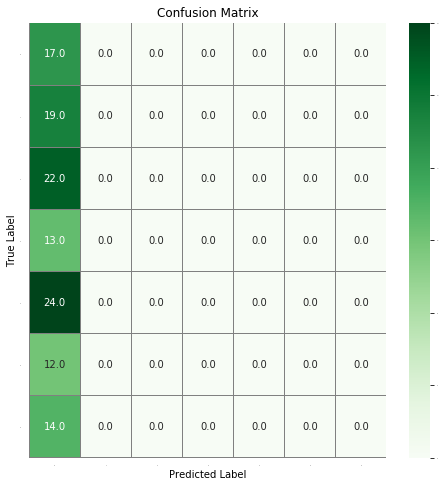

In [169]:
# Confusion matrix 
cfm = confusion_matrix(Y_test, results)

#plot the confusion matrix
fig, ax = plt.subplots(figsize=(8,8))
sns.heatmap(cfm, annot=True, linewidths=0.01,cmap="Greens",linecolor="gray", fmt= '.1f',ax=ax)
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix")
plt.show()